<a href="https://colab.research.google.com/github/appiahs5/Calculator/blob/main/warfare.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from statsmodels.formula.api import ols
import seaborn as sns

In [23]:
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.ensemble import IsolationForest


In [3]:
pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.8/357.8 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 394.2/394.2 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 36.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=857bbdc37fdb60d57800a7f53740384d972947de900d0adb2d0a88d932addf9b
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting unin

In [4]:
pip install ydata-profiling==4.1.2


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.7/33.7 MB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 71.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 81.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 97.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 750.1 kB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.0.7
    Uninstalling urllib3-2.0.7:
      Successfully uninstalled urllib3-2.0.7
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.1.5
    Uninstalling typeguard-4.1.5:
      Successfully uninstalled typeguard-4.1.5
  Attempting uninstall: tqdm
    F

In [1]:
import ydata_profiling

/usr/local/lib/python3.10/dist-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/usr/local/lib/python3.10/dist-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


In [2]:
from pandas_profiling import ProfileReport

<ipython-input-2-e2a33329b6f0>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [16]:
df = pd.read_csv("/content/cummulative_loss_value.csv")

In [6]:
df

,Unnamed: 0,date,aircraft,helicopter,tank,APC,field artillery,MRL,drone,naval ship,anti-aircraft warfare,military auto
0,0,2022-02,435000000,232000000,180000000,326400000,44400000,16800000,300000,20000000,25000000,23280000
1,1,2022-03,2025000000,1048000000,736800000,694000000,186600000,76800000,8300000,70000000,270000000,96080000
2,2,2022-04,2850000000,1240000000,1209600000,978000000,261600000,120800000,23200000,890000000,385000000,136080000
3,3,2022-05,3120000000,1392000000,1629600000,1320800000,389400000,165600000,51500000,900000000,465000000,182000000
4,4,2022-06,3255000000,1480000000,1887600000,1490400000,474000000,196800000,64100000,900000000,520000000,208160000
5,5,2022-07,3345000000,1520000000,2115600000,1601600000,549600000,207200000,73500000,900000000,585000000,232160000
6,6,2022-08,3510000000,1632000000,2368800000,1724800000,654600000,228000000,84900000,900000000,760000000,258880000
7,7,2022-09,3960000000,1800000000,2805600000,1972800000,834600000,266400000,100300000,900000000,880000000,301440000
8,8,2022-10,3990000000,1880000000,2983200000,2053200000,886200000,278400000,108600000,900000000,900000000,311200000


In [7]:
df.describe()

,Unnamed: 0,aircraft,helicopter,tank,APC,field artillery,MRL,drone,naval ship,anti-aircraft warfare,military auto
count,9.000000,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00
mean,4.000000,2.943333e+09,1.358222e+09,1.768533e+09,1.351333e+09,4.756667e+08,1.729778e+08,5.718889e+07,7.088889e+08,5.322222e+08,1.943644e+08
std,2.738613,1.111514e+09,4.953670e+08,9.331061e+08,5.834352e+08,2.867215e+08,8.734005e+07,3.936602e+07,3.766114e+08,2.879357e+08,9.577087e+07
min,0.000000,4.350000e+08,2.320000e+08,1.800000e+08,3.264000e+08,4.440000e+07,1.680000e+07,3.000000e+05,2.000000e+07,2.500000e+07,2.328000e+07
25%,2.000000,2.850000e+09,1.240000e+09,1.209600e+09,9.780000e+08,2.616000e+08,1.208000e+08,2.320000e+07,8.900000e+08,3.850000e+08,1.360800e+08
50%,4.000000,3.255000e+09,1.480000e+09,1.887600e+09,1.490400e+09,4.740000e+08,1.968000e+08,6.410000e+07,9.000000e+08,5.200000e+08,2.081600e+08
75%,6.000000,3.510000e+09,1.632000e+09,2.368800e+09,1.724800e+09,6.546000e+08,2.280000e+08,8.490000e+07,9.000000e+08,7.600000e+08,2.588800e+08
max,8.000000,3.990000e+09,1.880000e+09,2.983200e+09,2.053200e+09,8.862000e+08,2.784000e+08,1.086000e+08,9.000000e+08,9.000000e+08,3.112000e+08


In [8]:
print(df.isnull().sum())

Unnamed: 0               0
date                     0
aircraft                 0
helicopter               0
tank                     0
APC                      0
field artillery          0
MRL                      0
drone                    0
naval ship               0
anti-aircraft warfare    0
military auto            0
dtype: int64


In [9]:
df.columns

Index(['Unnamed: 0', 'date', 'aircraft', 'helicopter', 'tank', 'APC',
       'field artillery', 'MRL', 'drone', 'naval ship',
       'anti-aircraft warfare', 'military auto'],
      dtype='object')

In [10]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:498: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Plot monthly losses for each category

<AxesSubplot: xlabel='date', ylabel='aircraft'>

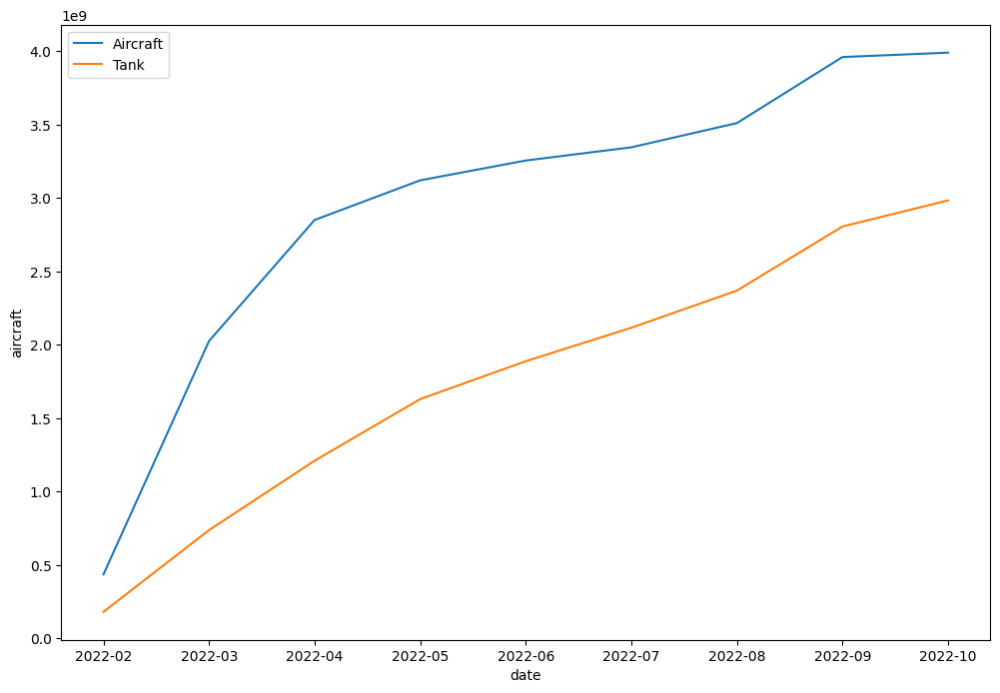

In [13]:
plt.figure(figsize=(12, 8))
sns.lineplot(x='date', y='aircraft', data=df, label='Aircraft')
sns.lineplot(x='date', y='tank', data=df, label='Tank')

In [ ]:
# Repeat for other categories...


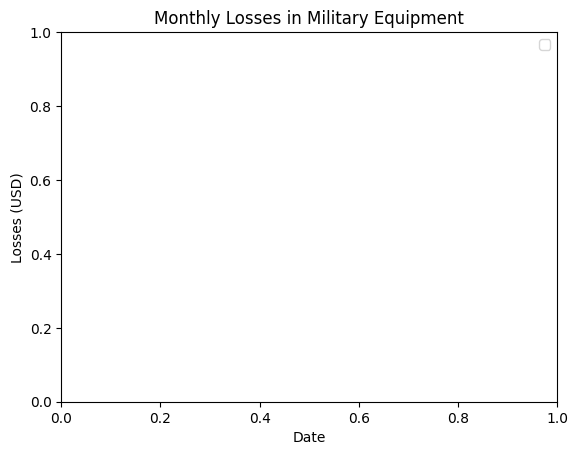

In [14]:
plt.title('Monthly Losses in Military Equipment')
plt.xlabel('Date')
plt.ylabel('Losses (USD)')
plt.legend()
plt.show()

In [ ]:
#Probabilistic Modeling:

In [16]:
pip install seaborn pgmpy # installing pgmpy libraries in python


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 11.2 MB/s eta 0:00:00


In [17]:
from pgmpy.models import BayesianModel
from pgmpy.estimators import ParameterEstimator
from pgmpy.inference import VariableElimination

In [23]:
df.columns

Index(['Unnamed: 0', 'date', 'aircraft', 'helicopter', 'tank', 'APC',
       'field artillery', 'MRL', 'drone', 'naval ship',
       'anti-aircraft warfare', 'military auto'],
      dtype='object')

In [ ]:
# Create Bayesian Model

In [29]:
from pgmpy.estimators import MaximumLikelihoodEstimator

In [26]:
model = BayesianModel([('tank', 'aircraft'), ('APC', 'field artillery'), ('field artillery', 'MRL')])


In [ ]:
# Fit the model to data to data using Maximum Likelihood Estimator

In [30]:
model.fit(df, estimator=MaximumLikelihoodEstimator)


In [ ]:
#Print the Conditional Probability Distribution for 'aircraft'

In [31]:
cpd_aircraft = model.get_cpds('aircraft')
print(cpd_aircraft)

+----------------------+-----------------+-----+------------------+------------------+
| tank                 | tank(180000000) | ... | tank(2805600000) | tank(2983200000) |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(435000000)  | 1.0             | ... | 0.0              | 0.0              |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(2025000000) | 0.0             | ... | 0.0              | 0.0              |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(2850000000) | 0.0             | ... | 0.0              | 0.0              |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(3120000000) | 0.0             | ... | 0.0              | 0.0              |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(3255000000) | 0.0             | 

In [33]:
# Print the Conditional Probability Distribution for 'aircraft'
cpd_aircraft = MaximumLikelihoodEstimator(model, df).estimate_cpd('aircraft')
print(cpd_aircraft)

+----------------------+-----------------+-----+------------------+------------------+
| tank                 | tank(180000000) | ... | tank(2805600000) | tank(2983200000) |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(435000000)  | 1.0             | ... | 0.0              | 0.0              |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(2025000000) | 0.0             | ... | 0.0              | 0.0              |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(2850000000) | 0.0             | ... | 0.0              | 0.0              |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(3120000000) | 0.0             | ... | 0.0              | 0.0              |
+----------------------+-----------------+-----+------------------+------------------+
| aircraft(3255000000) | 0.0             | 

In [35]:
# Predict future losses
# Assuming 'tank' has possible states [0, 1, 2, ...]
predicted_losses = inference.map_query(variables=['aircraft'], evidence={'tank': 2})

print(predicted_losses)

0it [00:00, ?it/s]

0it [00:00, ?it/s]

{'aircraft': 2850000000}


In [7]:
df.head(20)

,Unnamed: 0,date,aircraft,helicopter,tank,APC,field artillery,MRL,drone,naval ship,anti-aircraft warfare,military auto
0,0,2022-02,435000000,232000000,180000000,326400000,44400000,16800000,300000,20000000,25000000,23280000
1,1,2022-03,2025000000,1048000000,736800000,694000000,186600000,76800000,8300000,70000000,270000000,96080000
2,2,2022-04,2850000000,1240000000,1209600000,978000000,261600000,120800000,23200000,890000000,385000000,136080000
3,3,2022-05,3120000000,1392000000,1629600000,1320800000,389400000,165600000,51500000,900000000,465000000,182000000
4,4,2022-06,3255000000,1480000000,1887600000,1490400000,474000000,196800000,64100000,900000000,520000000,208160000
5,5,2022-07,3345000000,1520000000,2115600000,1601600000,549600000,207200000,73500000,900000000,585000000,232160000
6,6,2022-08,3510000000,1632000000,2368800000,1724800000,654600000,228000000,84900000,900000000,760000000,258880000
7,7,2022-09,3960000000,1800000000,2805600000,1972800000,834600000,266400000,100300000,900000000,880000000,301440000
8,8,2022-10,3990000000,1880000000,2983200000,2053200000,886200000,278400000,108600000,900000000,900000000,311200000


In [8]:
df.tail()

,Unnamed: 0,date,aircraft,helicopter,tank,APC,field artillery,MRL,drone,naval ship,anti-aircraft warfare,military auto
4,4,2022-06,3255000000,1480000000,1887600000,1490400000,474000000,196800000,64100000,900000000,520000000,208160000
5,5,2022-07,3345000000,1520000000,2115600000,1601600000,549600000,207200000,73500000,900000000,585000000,232160000
6,6,2022-08,3510000000,1632000000,2368800000,1724800000,654600000,228000000,84900000,900000000,760000000,258880000
7,7,2022-09,3960000000,1800000000,2805600000,1972800000,834600000,266400000,100300000,900000000,880000000,301440000
8,8,2022-10,3990000000,1880000000,2983200000,2053200000,886200000,278400000,108600000,900000000,900000000,311200000


In [11]:
df.columns

Index(['Unnamed: 0', 'date', 'aircraft', 'helicopter', 'tank', 'APC',
       'field artillery', 'MRL', 'drone', 'naval ship',
       'anti-aircraft warfare', 'military auto'],
      dtype='object')

In [14]:
pip install pandas matplotlib statsmodels

In [17]:
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

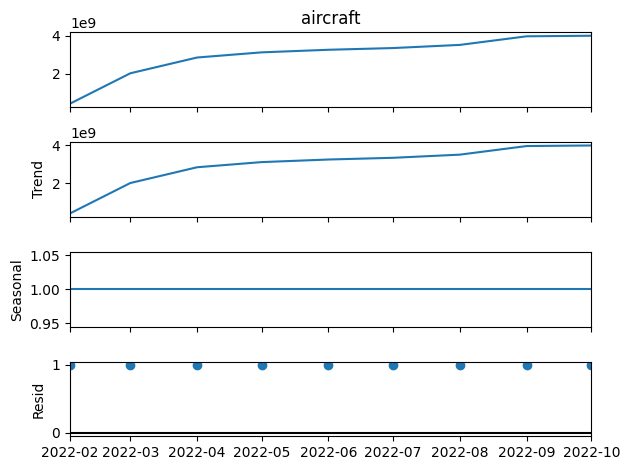

In [21]:
# Decompose time series to identify trends
result = seasonal_decompose(df['aircraft'], model='multiplicative', period=1)
result.plot()
plt.show()

In [22]:
#Outlier Detection:

In [24]:
# Use Isolation Forest for outlier detection
model = IsolationForest(contamination=0.05)  # Adjust the contamination parameter based on your dataset
df['outlier'] = model.fit_predict(df[['aircraft']])
outliers = df[df['outlier'] == -1]

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


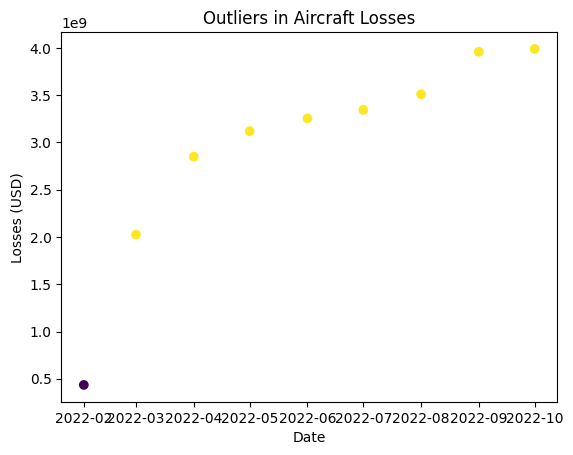

In [25]:
# Visualize outliers
plt.scatter(df.index, df['aircraft'], c=df['outlier'], cmap='viridis')
plt.title('Outliers in Aircraft Losses')
plt.xlabel('Date')
plt.ylabel('Losses (USD)')
plt.show()

In [26]:
# Display outlier details
print("Outliers:")
print(outliers)

Outliers:
            Unnamed: 0   aircraft  helicopter       tank        APC  \
date                                                                  
2022-02-01           0  435000000   232000000  180000000  326400000   

            field artillery       MRL   drone  naval ship  \
date                                                        
2022-02-01         44400000  16800000  300000    20000000   

            anti-aircraft warfare  military auto  outlier  
date                                                       
2022-02-01               25000000       23280000       -1  


In [ ]:
 #Explanation with Generative AI:

In [39]:
import requests

In [40]:
# Set your OpenAI API key
api_key = 'your_openai_api_key'

In [41]:
# Define a prompt for trend analysis
trend_analysis_prompt = "Identify trends in the aircraft losses over the past months."





In [42]:
# Make a request to OpenAI GPT-3
response_trend = requests.post(
    'https://api.openai.com/v1/engines/davinci/completions',
    headers={'Authorization': f'Bearer {api_key}'},
    json={'prompt': trend_analysis_prompt, 'max_tokens': 150}
)

In [46]:
# Display the generated report
response_data = response_trend.json()


In [61]:
# Check the structure of the response
print(response_data)

{'error': {'message': 'Incorrect API key provided: your_ope*******_key. You can find your API key at https://platform.openai.com/account/api-keys.', 'type': 'invalid_request_error', 'param': None, 'code': 'invalid_api_key'}}


In [51]:
# Print the entire JSON response
print(response_data)

{'error': {'message': 'Incorrect API key provided: your_ope*******_key. You can find your API key at https://platform.openai.com/account/api-keys.', 'type': 'invalid_request_error', 'param': None, 'code': 'invalid_api_key'}}


In [55]:
api_key = "sk-...iv4F"

In [59]:
# Make a request to OpenAI GPT-3
response_trend = requests.post(
    'https://api.openai.com/v1/engines/davinci/completions',
    headers={'Authorization': f'Bearer {api_key}'},
    json={'prompt': trend_analysis_prompt, 'max_tokens': 150}
)

In [63]:
# Access the generated text if 'choices' key is present
if 'choices' in response_data:
    generated_text = response_data['choices'][0]['text']
    print(generated_text)
else:
    print("Unexpected response structure. Please check the response data.")


Unexpected response structure. Please check the response data.


In [64]:
# Display the generated report
response_data = response_trend.json()


In [65]:
# Check the structure of the response
print(response_data)

{'error': {'message': 'Incorrect API key provided: sk-...iv4F. You can find your API key at https://platform.openai.com/account/api-keys.', 'type': 'invalid_request_error', 'param': None, 'code': 'invalid_api_key'}}
